In [1]:
!pip install opencv-python opencv-contrib-python matplotlib numpy

   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   ---------------------------------------- 0.0/45.3 MB ? eta -:--:--
   -----------------

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 1.2.11 requires idna==3.7, but you have idna 3.10 which is incompatible.
roboflow 1.2.11 requires opencv-python-headless==4.10.0.84, but you have opencv-python-headless 4.10.0 which is incompatible.
sklearn-compat 0.1.3 requires scikit-learn<1.7,>=1.2, but you have scikit-learn 1.7.2 which is incompatible.


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

# ============================================================================
# CONFIGURATION
# ============================================================================

DATASET_PATH = "room_dataset" #change path to your own
IMAGE_PREFIX = "img_"
IMAGE_EXTENSION = ".jpeg"

# ============================================================================
# 1. LOAD DATASET
# ============================================================================

def load_images(dataset_path, num_images=31):
    images = []
    image_paths = []
    
    for i in range(1, num_images + 1):
        img_name = f"{IMAGE_PREFIX}{i:02d}{IMAGE_EXTENSION}"
        img_path = os.path.join(dataset_path, img_name)
        
        if os.path.exists(img_path):
            img = cv2.imread(img_path)
            if img is not None:
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                images.append(img_rgb)
                image_paths.append(img_path)
                print(f"Loaded: {img_name} - Shape: {img.shape}")
            else:
                print(f"Warning: Could not read {img_name}")
        else:
            print(f"Warning: File not found {img_name}")
    
    print(f"\nTotal images loaded: {len(images)}")
    return images, image_paths

# Load all images
images, image_paths = load_images(DATASET_PATH)


Loaded: img_01.jpeg - Shape: (3024, 4032, 3)
Loaded: img_02.jpeg - Shape: (3024, 4032, 3)
Loaded: img_03.jpeg - Shape: (3024, 4032, 3)
Loaded: img_04.jpeg - Shape: (3024, 4032, 3)
Loaded: img_05.jpeg - Shape: (3024, 4032, 3)
Loaded: img_06.jpeg - Shape: (3024, 4032, 3)
Loaded: img_07.jpeg - Shape: (3024, 4032, 3)
Loaded: img_08.jpeg - Shape: (3024, 4032, 3)
Loaded: img_05.jpeg - Shape: (3024, 4032, 3)
Loaded: img_06.jpeg - Shape: (3024, 4032, 3)
Loaded: img_07.jpeg - Shape: (3024, 4032, 3)
Loaded: img_08.jpeg - Shape: (3024, 4032, 3)
Loaded: img_09.jpeg - Shape: (3024, 4032, 3)
Loaded: img_10.jpeg - Shape: (3024, 4032, 3)
Loaded: img_11.jpeg - Shape: (3024, 4032, 3)
Loaded: img_12.jpeg - Shape: (3024, 4032, 3)
Loaded: img_09.jpeg - Shape: (3024, 4032, 3)
Loaded: img_10.jpeg - Shape: (3024, 4032, 3)
Loaded: img_11.jpeg - Shape: (3024, 4032, 3)
Loaded: img_12.jpeg - Shape: (3024, 4032, 3)
Loaded: img_13.jpeg - Shape: (3024, 4032, 3)
Loaded: img_14.jpeg - Shape: (3024, 4032, 3)
Loaded: im


DISPLAYING ALL IMAGES IN ORDER


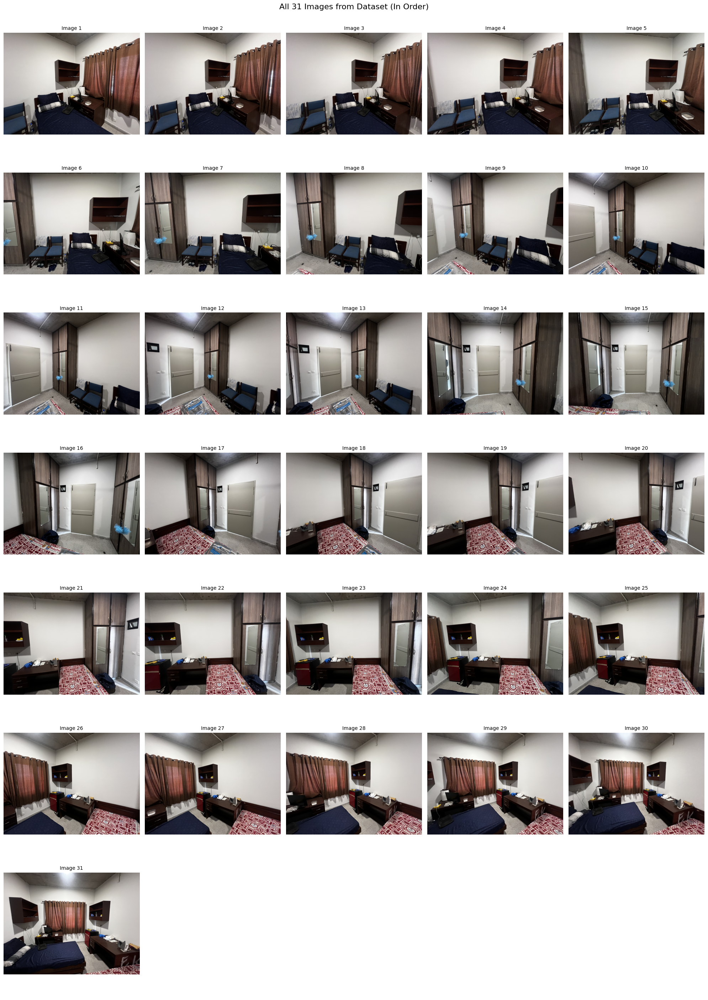

In [7]:

def display_image_grid(images, cols=5):
    num_images = len(images)
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    axes = axes.flatten()
    
    # Display all images in order
    for idx, ax in enumerate(axes):
        if idx < num_images:
            ax.imshow(images[idx])
            ax.set_title(f"Image {idx + 1}", fontsize=10)
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.suptitle(f"All {num_images} Images from Dataset (In Order)", fontsize=16, y=1.002)
    plt.show()

# Display all 31 images
print("\n" + "="*80)
print("DISPLAYING ALL IMAGES IN ORDER")
print("="*80)
display_image_grid(images, cols=5)


PREPROCESSING EXAMPLE


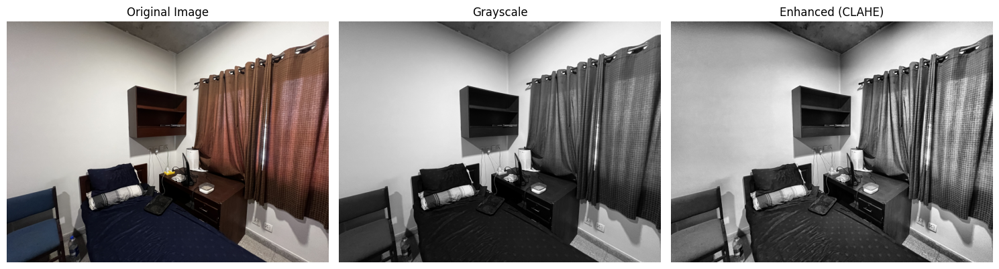

In [8]:

# ============================================================================
# 3. PREPROCESSING
# ============================================================================

def preprocess_image(img):
    """
    Apply preprocessing to improve feature detection.
    - Convert to grayscale
    - Apply histogram equalization (optional, for better contrast)
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    
    return gray, enhanced

print("\n" + "="*80)
print("PREPROCESSING EXAMPLE")
print("="*80)

sample_img = images[0]
gray, enhanced = preprocess_image(sample_img)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(sample_img)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(gray, cmap='gray')
axes[1].set_title("Grayscale")
axes[1].axis('off')

axes[2].imshow(enhanced, cmap='gray')
axes[2].set_title("Enhanced (CLAHE)")
axes[2].axis('off')

plt.tight_layout()
plt.show()



In [9]:
# ============================================================================
# 4. FEATURE DETECTION & MATCHING
# ============================================================================

def detect_and_match_features(img1, img2, use_sift=True, ratio_threshold=0.75):
    """
    Detect features in two images and match them.
    
    Args:
        img1, img2: Input images (RGB)
        use_sift: If True, use SIFT; otherwise use ORB
        ratio_threshold: Lowe's ratio test threshold
    
    Returns:
        keypoints1, keypoints2: Detected keypoints
        good_matches: Filtered matches
        descriptors1, descriptors2: Feature descriptors
    """
    # Preprocess images
    gray1, _ = preprocess_image(img1)
    gray2, _ = preprocess_image(img2)
    
    # Initialize feature detector
    if use_sift:
        detector = cv2.SIFT_create(nfeatures=2000)
        print("Using SIFT feature detector")
    else:
        detector = cv2.ORB_create(nfeatures=2000)
        print("Using ORB feature detector")
    
    # Detect keypoints and compute descriptors
    kp1, des1 = detector.detectAndCompute(gray1, None)
    kp2, des2 = detector.detectAndCompute(gray2, None)
    
    print(f"Detected {len(kp1)} keypoints in image 1")
    print(f"Detected {len(kp2)} keypoints in image 2")
    
    # Match features
    if use_sift:
        # FLANN matcher for SIFT
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        matcher = cv2.FlannBasedMatcher(index_params, search_params)
    else:
        # BFMatcher for ORB
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    
    # Find k=2 nearest matches for each descriptor
    matches = matcher.knnMatch(des1, des2, k=2)
    
    # Apply Lowe's ratio test
    good_matches = []
    for match_pair in matches:
        if len(match_pair) == 2:
            m, n = match_pair
            if m.distance < ratio_threshold * n.distance:
                good_matches.append(m)
    
    print(f"Total matches: {len(matches)}")
    print(f"Good matches after ratio test: {len(good_matches)}")
    
    return kp1, kp2, good_matches, des1, des2

def visualize_matches(img1, img2, kp1, kp2, matches, title="Feature Matches"):
    """Visualize feature matches between two images."""
    # Create match visualization
    img_matches = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:100],  # Show top 100 matches
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        matchColor=(0, 255, 0),
        singlePointColor=(255, 0, 0)
    )
    
    plt.figure(figsize=(20, 10))
    plt.imshow(img_matches)
    plt.title(f"{title} - Showing top 100 matches out of {len(matches)}", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return img_matches



FEATURE MATCHING BETWEEN CONSECUTIVE IMAGES

Matching Image 1 with Image 2
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 454
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 454


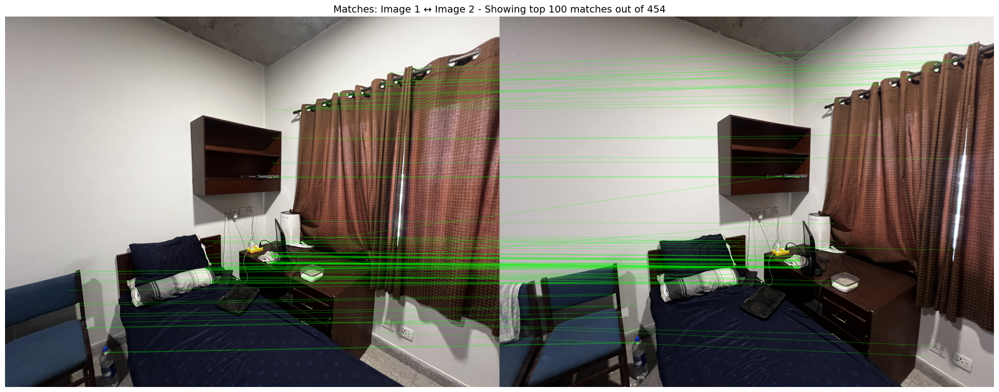


Matching Image 2 with Image 3
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 569
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 569


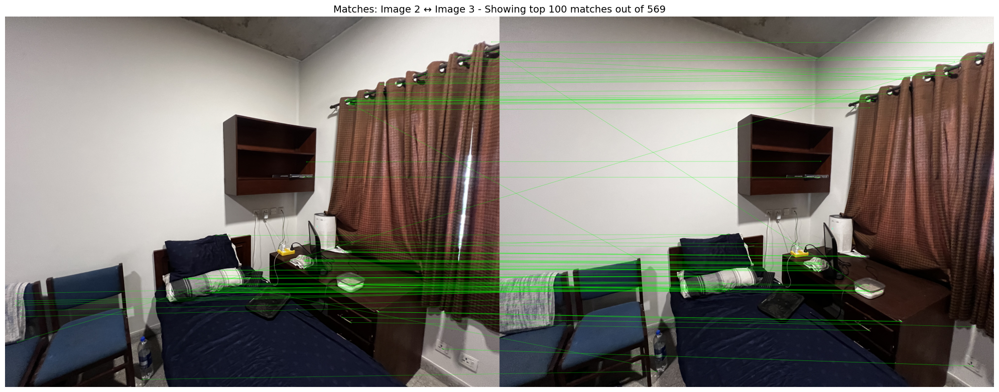


Matching Image 3 with Image 4
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 567
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 567


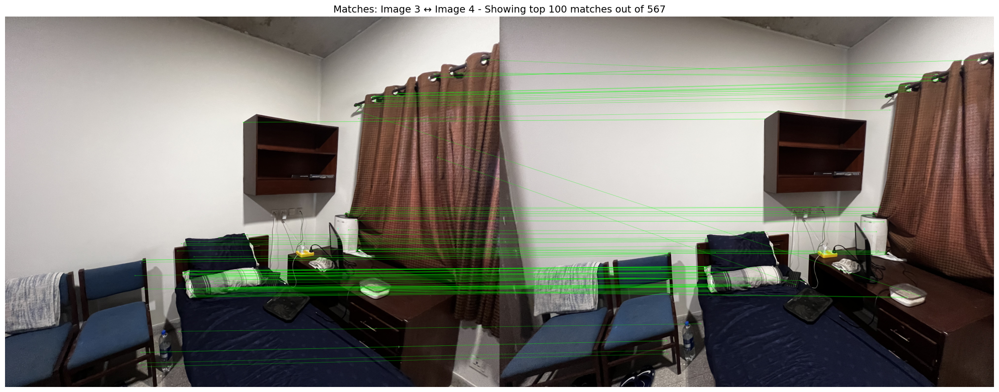


Matching Image 4 with Image 5
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 482
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 482


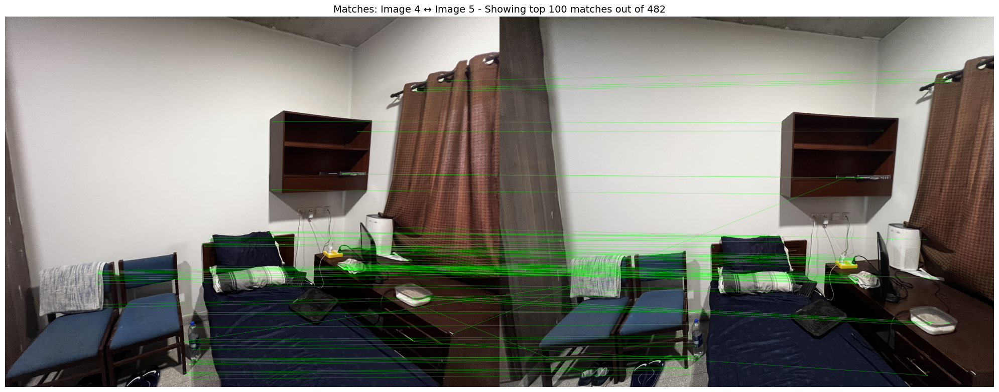


Matching Image 5 with Image 6
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 609
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 609


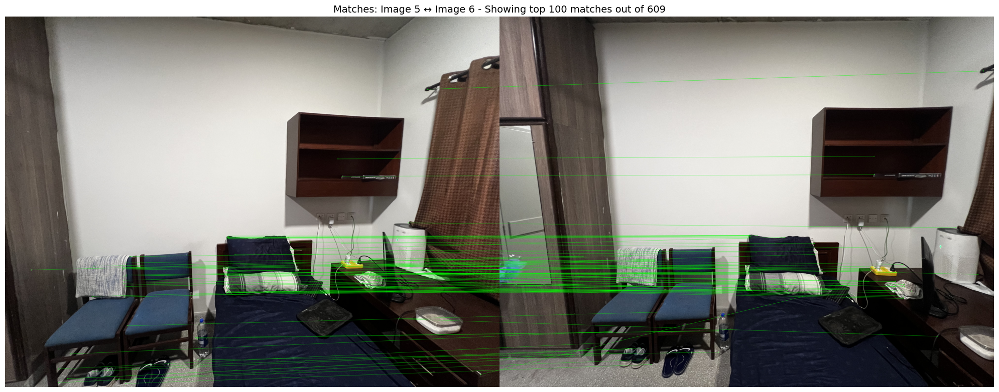

In [10]:

# ============================================================================
# 5. FEATURE MATCHING FOR CONSECUTIVE IMAGE PAIRS
# ============================================================================

print("\n" + "="*80)
print("FEATURE MATCHING BETWEEN CONSECUTIVE IMAGES")
print("="*80)

num_pairs = 5
start_idx = 0

matching_results = []

for i in range(num_pairs):
    idx1 = start_idx + i
    idx2 = start_idx + i + 1
    
    if idx2 >= len(images):
        break
    
    print(f"\n{'='*80}")
    print(f"Matching Image {idx1+1} with Image {idx2+1}")
    print(f"{'='*80}")
    
    # Detect and match features
    kp1, kp2, good_matches, des1, des2 = detect_and_match_features(
        images[idx1], 
        images[idx2], 
        use_sift=True,
        ratio_threshold=0.75
    )
    
    # Store results
    matching_results.append({
        'idx1': idx1,
        'idx2': idx2,
        'kp1': kp1,
        'kp2': kp2,
        'matches': good_matches,
        'des1': des1,
        'des2': des2
    })
    
    # Visualize matches
    visualize_matches(
        images[idx1], 
        images[idx2], 
        kp1, 
        kp2, 
        good_matches,
        title=f"Matches: Image {idx1+1} ↔ Image {idx2+1}"
    )



MATCHING STATISTICS SUMMARY
Image 1 → Image 2:
  Keypoints: 2000 → 2000
  Good Matches: 454

Image 2 → Image 3:
  Keypoints: 2000 → 2000
  Good Matches: 569

Image 3 → Image 4:
  Keypoints: 2000 → 2000
  Good Matches: 567

Image 4 → Image 5:
  Keypoints: 2000 → 2000
  Good Matches: 482

Image 5 → Image 6:
  Keypoints: 2000 → 2000
  Good Matches: 609



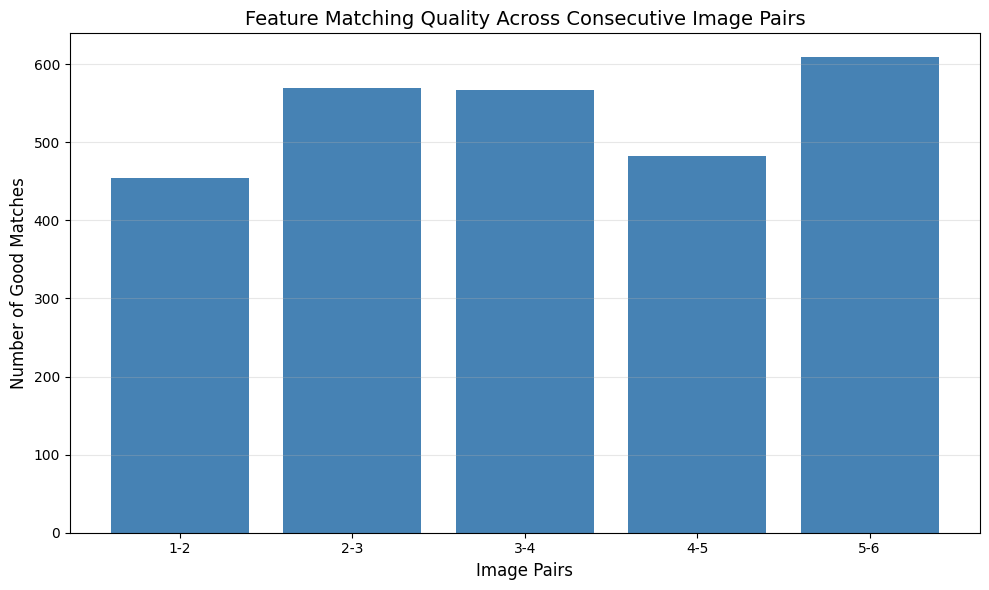

In [11]:

# ============================================================================
# 6. SUMMARY STATISTICS
# ============================================================================

print("\n" + "="*80)
print("MATCHING STATISTICS SUMMARY")
print("="*80)

for result in matching_results:
    print(f"Image {result['idx1']+1} → Image {result['idx2']+1}:")
    print(f"  Keypoints: {len(result['kp1'])} → {len(result['kp2'])}")
    print(f"  Good Matches: {len(result['matches'])}")
    print()

# Visualize statistics
fig, ax = plt.subplots(figsize=(10, 6))
pair_labels = [f"{r['idx1']+1}-{r['idx2']+1}" for r in matching_results]
match_counts = [len(r['matches']) for r in matching_results]

ax.bar(pair_labels, match_counts, color='steelblue')
ax.set_xlabel('Image Pairs', fontsize=12)
ax.set_ylabel('Number of Good Matches', fontsize=12)
ax.set_title('Feature Matching Quality Across Consecutive Image Pairs', fontsize=14)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()


In [12]:
# ============================================================================
# 7. 3D RECONSTRUCTION AND POINT CLOUD GENERATION
# ============================================================================

def get_image_center_details(img):
    """Get the center coordinates and pixel value of an image."""
    h, w = img.shape[:2]
    center_x, center_y = w // 2, h // 2
    center_pixel = img[center_y, center_x]
    return (center_x, center_y), center_pixel


def compute_essential_matrix(kp1, kp2, matches, K):
    """Compute Essential matrix from matched keypoints."""
    if len(matches) < 8:  # Need at least 8 points
        print(f"Not enough matches ({len(matches)}). Need at least 8.")
        return None, None

    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])

    E, mask = cv2.findEssentialMat(pts1, pts2, K, method=cv2.RANSAC, prob=0.999, threshold=1.0)
    
    if mask is not None:
        num_inliers = np.sum(mask)
        print(f"Essential matrix computed. Inliers: {num_inliers}/{len(matches)}")
    
    return E, mask


def decompose_essential_matrix(E, kp1, kp2, matches, K, mask=None):
    """
    Decompose Essential matrix and test all 4 possible camera poses.
    Select the pose with most points in front of both cameras (cheirality check).
    """
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])
    
    # Use only inliers if mask is provided
    if mask is not None:
        pts1 = pts1[mask.ravel() == 1]
        pts2 = pts2[mask.ravel() == 1]

    print(f"Testing {len(pts1)} point correspondences for pose disambiguation")
    
    # Decompose E into R and t (4 possible solutions)
    # E = [t]_x * R, where [t]_x is the skew-symmetric matrix of t
    R1, R2, t_vec = cv2.decomposeEssentialMat(E)
    
    # The 4 possible poses are:
    # (R1, t), (R1, -t), (R2, t), (R2, -t)
    possible_poses = [
        (R1, t_vec),
        (R1, -t_vec),
        (R2, t_vec),
        (R2, -t_vec)
    ]
    
    print(f"\nTesting 4 possible camera poses:")
    print("-" * 60)
    
    best_pose = None
    max_good_points = 0
    best_idx = -1
    
    # Test each pose
    for idx, (R, t) in enumerate(possible_poses):
        # Triangulate points with this pose
        proj_matrix1 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))
        proj_matrix2 = K @ np.hstack((R, t))
        
        points_4d = cv2.triangulatePoints(proj_matrix1, proj_matrix2, pts1.T, pts2.T)
        points_3d = points_4d[:3] / points_4d[3]
        
        # Check cheirality: points should have positive depth in BOTH cameras
        # For camera 1 (at origin): check if Z > 0
        depths_cam1 = points_3d[2, :]
        
        # For camera 2: transform points to camera 2 frame
        # P_cam2 = R * P_world + t
        points_3d_cam2 = R @ points_3d + t
        depths_cam2 = points_3d_cam2[2, :]
        
        # Count points with positive depth in BOTH cameras
        good_points = np.sum((depths_cam1 > 0) & (depths_cam2 > 0))
        
        print(f"Pose {idx+1}: R{1 if idx < 2 else 2}, {'t' if idx % 2 == 0 else '-t'}")
        print(f"  Points in front of cam1: {np.sum(depths_cam1 > 0)}")
        print(f"  Points in front of cam2: {np.sum(depths_cam2 > 0)}")
        print(f"  Points in front of BOTH: {good_points}")
        
        if good_points > max_good_points:
            max_good_points = good_points
            best_pose = (R, t)
            best_idx = idx
    
    print("-" * 60)
    print(f"✓ Selected Pose {best_idx+1} with {max_good_points}/{len(pts1)} valid points")
    print(f"  ({max_good_points/len(pts1)*100:.1f}% pass cheirality check)\n")
    
    R_final, t_final = best_pose
    
    return R_final, t_final, pts1, pts2


def triangulate_points(R, t, pts1, pts2, K):
    """Triangulate 3D points from 2D correspondences."""
    proj_matrix1 = K @ np.hstack((np.eye(3), np.zeros((3, 1))))
    proj_matrix2 = K @ np.hstack((R, t))

    points_4d_hom = cv2.triangulatePoints(proj_matrix1, proj_matrix2, pts1.T, pts2.T)
    points_3d = points_4d_hom[:3] / points_4d_hom[3]
    points_3d = points_3d.T  # Convert to Nx3

    num_positive_depth = np.sum(points_3d[:, 2] > 0)
    print(f"Triangulated {len(points_3d)} points, {num_positive_depth} with positive depth")

    return points_3d

In [13]:
def filter_point_cloud(points_3d, pts1, img1):
    """
    Filter outliers to produce a valid sparse point cloud.
    Removes: negative depth, extreme outliers, infinite/NaN values.
    """
    h, w = img1.shape[:2]
    
    print(f"Initial points: {len(points_3d)}")
    
    # Step 1: Remove NaN and infinite values
    valid_mask = ~(np.isnan(points_3d).any(axis=1) | np.isinf(points_3d).any(axis=1))
    print(f"  After removing NaN/Inf: {np.sum(valid_mask)}")
    
    # Step 2: Keep only positive depth points (in front of camera)
    valid_mask &= points_3d[:, 2] > 0
    print(f"  After positive depth filter: {np.sum(valid_mask)}")
    
    # Step 3: Remove points that are too close (likely noise)
    distances = np.linalg.norm(points_3d, axis=1)
    min_distance = np.percentile(distances[valid_mask], 5)  # 5th percentile
    valid_mask &= distances > min_distance
    print(f"  After minimum distance filter: {np.sum(valid_mask)}")
    
    # Step 4: Remove extreme outliers (top 5% by distance)
    max_distance = np.percentile(distances[valid_mask], 95)  # 95th percentile
    valid_mask &= distances < max_distance
    print(f"  After maximum distance filter: {np.sum(valid_mask)}")
    
    # Step 5: Filter by Z-depth range
    z_values = points_3d[:, 2]
    z_min = np.percentile(z_values[valid_mask], 5)
    z_max = np.percentile(z_values[valid_mask], 95)
    valid_mask &= (z_values > z_min) & (z_values < z_max)
    print(f"  After Z-depth range filter: {np.sum(valid_mask)}")
    
    # Step 6: Filter by reprojection quality (points should be within image bounds)
    pts1_valid = pts1.copy()
    x_coords = pts1_valid[:, 0]
    y_coords = pts1_valid[:, 1]
    margin = 10  # pixels from edge
    valid_mask &= (x_coords >= margin) & (x_coords < w - margin)
    valid_mask &= (y_coords >= margin) & (y_coords < h - margin)
    print(f"  After image boundary filter: {np.sum(valid_mask)}")
    
    # Apply all filters
    points_filtered = points_3d[valid_mask]
    pts1_filtered = pts1[valid_mask]
    
    # Step 7: Extract colors from image
    colors = []
    for pt in pts1_filtered:
        x, y = int(round(pt[0])), int(round(pt[1]))
        # Double-check bounds (should already be valid)
        if 0 <= x < w and 0 <= y < h:
            colors.append(img1[y, x])
        else:
            colors.append([128, 128, 128])  # Gray fallback
    
    colors = np.array(colors, dtype=np.uint8)
    
    print(f"\n  ✓ Final valid sparse point cloud: {len(points_filtered)} points")
    print(f"  Filtering retained: {len(points_filtered)/len(points_3d)*100:.1f}% of triangulated points\n")
    
    return points_filtered, colors


def save_ply(points_3d, colors, filename="point_cloud.ply"):
    """
    Save sparse 3D point cloud to PLY file with proper formatting.
    """
    # Validate data
    assert len(points_3d) == len(colors), "Points and colors must have same length"
    assert points_3d.shape[1] == 3, "Points must be Nx3"
    assert colors.shape[1] == 3, "Colors must be Nx3"
    
    num_points = len(points_3d)
    
    with open(filename, 'w') as f:
        # Write PLY header
        f.write("ply\n")
        f.write("format ascii 1.0\n")
        f.write(f"comment Created by 3D Reconstruction Pipeline\n")
        f.write(f"comment Sparse point cloud from stereo pair\n")
        f.write(f"element vertex {num_points}\n")
        f.write("property float x\n")
        f.write("property float y\n")
        f.write("property float z\n")
        f.write("property uchar red\n")
        f.write("property uchar green\n")
        f.write("property uchar blue\n")
        f.write("end_header\n")
        
        # Write vertex data (each point with its color)
        for point, color in zip(points_3d, colors):
            # Format: x y z r g b
            f.write(f"{point[0]:.6f} {point[1]:.6f} {point[2]:.6f} ")
            f.write(f"{int(color[0])} {int(color[1])} {int(color[2])}\n")
    
    print(f"✓ PLY file saved: {filename}")
    print(f"  Format: ASCII PLY")
    print(f"  Vertices: {num_points}")
    print(f"  Properties: XYZ position + RGB color")
    
    # Print point cloud statistics
    print(f"\n  Point Cloud Bounds:")
    print(f"    X: [{points_3d[:, 0].min():.2f}, {points_3d[:, 0].max():.2f}]")
    print(f"    Y: [{points_3d[:, 1].min():.2f}, {points_3d[:, 1].max():.2f}]")
    print(f"    Z: [{points_3d[:, 2].min():.2f}, {points_3d[:, 2].max():.2f}]")
    print(f"  Center: ({points_3d[:, 0].mean():.2f}, {points_3d[:, 1].mean():.2f}, {points_3d[:, 2].mean():.2f})")

def validate_point_cloud(points_3d, colors):
    """
    Validate that the point cloud is properly formed.
    """
    issues = []
    
    # Check for NaN or Inf
    if np.isnan(points_3d).any():
        issues.append("Contains NaN values")
    if np.isinf(points_3d).any():
        issues.append("Contains Inf values")
    
    # Check for negative depths
    if np.any(points_3d[:, 2] <= 0):
        issues.append(f"{np.sum(points_3d[:, 2] <= 0)} points have negative/zero depth")
    
    # Check color range
    if np.any(colors < 0) or np.any(colors > 255):
        issues.append("Colors outside valid range [0, 255]")
    
    # Check if cloud is too sparse
    if len(points_3d) < 10:
        issues.append(f"Very sparse cloud (only {len(points_3d)} points)")
    
    if issues:
        print("⚠ Point cloud validation warnings:")
        for issue in issues:
            print(f"  - {issue}")
        return False
    else:
        print("✓ Point cloud validation passed")
        return True

In [14]:
def generate_point_cloud_pipeline(img1, img2, output_filename="point_cloud.ply", focal_length=None):
    """
    Complete pipeline: two images → 3D point cloud → .ply file
    
    Args:
        img1, img2: Input images (RGB)
        output_filename: Output .ply filename
        focal_length: Camera focal length (defaults to image width)
    
    Returns:
        points_3d, colors, R, t
    """
    print("\n" + "="*80)
    print("GENERATING 3D POINT CLOUD")
    print("="*80 + "\n")
    
    # Step 1: Camera intrinsics
    h, w = img1.shape[:2]
    print(f"Image size: {h} x {w}")
    
    if focal_length is None:
        focal_length = w  # Common approximation
    
    f_x = f_y = focal_length
    (p_x, p_y), _ = get_image_center_details(img1)
    
    K = np.array([[f_x, 0, p_x], 
                  [0, f_y, p_y], 
                  [0, 0, 1]], dtype=np.float64)
    print(f"Camera matrix K:\n{K}\n")
    
    # Step 2: Feature matching
    print("Step 1: Feature matching...")
    kp1, kp2, good_matches, des1, des2 = detect_and_match_features(img1, img2)
    
    if len(good_matches) < 8:
        print(f"❌ Not enough matches: {len(good_matches)}")
        return None, None, None, None
    
    # Step 3: Essential matrix
    print("\nStep 2: Computing Essential matrix...")
    E, mask = compute_essential_matrix(kp1, kp2, good_matches, K)
    
    if E is None:
        print("❌ Failed to compute Essential matrix")
        return None, None, None, None
    
    # Step 4: Camera pose
    print("\nStep 3: Recovering camera pose...")
    R, t, pts1_inliers, pts2_inliers = decompose_essential_matrix(E, kp1, kp2, good_matches, K, mask)
    print(f"Rotation:\n{R}")
    print(f"Translation: {t.ravel()}\n")
    
    # Step 5: Triangulation
    print("Step 4: Triangulating 3D points...")
    points_3d = triangulate_points(R, t, pts1_inliers, pts2_inliers, K)
    
    # Step 6: Filtering
    print("\nStep 5: Filtering outliers...")
    points_filtered, colors = filter_point_cloud(points_3d, pts1_inliers, img1)
    
    # Step 7: Save PLY
    print("\nStep 6: Saving PLY file...")
    save_ply(points_filtered, colors, output_filename)
    
    print(f"\n{'='*80}")
    print(f"✓ SUCCESS! Open '{output_filename}' in MeshLab/CloudCompare")
    print(f"{'='*80}\n")
    
    return points_filtered, colors, R, t

In [25]:
# Example usage with first two images
pcd_points, pcd_colors, R, t = generate_point_cloud_pipeline(images[0], images[1], output_filename="point_cloud_img1_img2.ply")


GENERATING 3D POINT CLOUD

Image size: 3024 x 4032
Camera matrix K:
[[4.032e+03 0.000e+00 2.016e+03]
 [0.000e+00 4.032e+03 1.512e+03]
 [0.000e+00 0.000e+00 1.000e+00]]

Step 1: Feature matching...
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 461

Step 2: Computing Essential matrix...
Essential matrix computed. Inliers: 236/461

Step 3: Recovering camera pose...
Testing 236 point correspondences for pose disambiguation

Testing 4 possible camera poses:
------------------------------------------------------------
Pose 1: R1, t
  Points in front of cam1: 236
  Points in front of cam2: 0
  Points in front of BOTH: 0
Pose 2: R1, -t
  Points in front of cam1: 0
  Points in front of cam2: 236
  Points in front of BOTH: 0
Pose 3: R2, t
  Points in front of cam1: 190
  Points in front of cam2: 190
  Points in front of BOTH: 190
Pose 4: R2, -t
  Points in front of cam1: 46
  Points in front o

In [27]:
# ============================================================================
# INTERACTIVE 3D VISUALIZATION with Plotly (Works Great in VS Code!)
# ============================================================================

import plotly.graph_objects as go

def visualize_ply_interactive(ply_filename):
    """
    Visualize PLY file using Plotly - Fully Interactive!
    
    Controls:
    - Left-click + drag: ROTATE
    - Scroll wheel: ZOOM
    - Right-click + drag: PAN
    - Double-click: RESET view
    """
    # Read PLY file
    points = []
    colors_rgb = []
    reading_data = False
    
    with open(ply_filename, 'r') as f:
        for line in f:
            line = line.strip()
            if line == "end_header":
                reading_data = True
                continue
            if reading_data and line:
                parts = line.split()
                if len(parts) >= 6:
                    x, y, z = float(parts[0]), float(parts[1]), float(parts[2])
                    r, g, b = int(parts[3]), int(parts[4]), int(parts[5])
                    points.append([x, y, z])
                    colors_rgb.append(f'rgb({r},{g},{b})')
    
    points = np.array(points)
    
    print(f"✅ Loaded {len(points)} points from {ply_filename}")
    
    # Create interactive 3D scatter plot
    fig = go.Figure(data=[go.Scatter3d(
        x=points[:, 0],
        y=points[:, 1],
        z=points[:, 2],
        mode='markers',
        marker=dict(
            size=3,
            color=colors_rgb,
            opacity=0.8
        ),
        text=[f'Point {i}' for i in range(len(points))],
        hoverinfo='text'
    )])
    
    # Update layout for better interactivity
    fig.update_layout(
        title=dict(
            text=f'🎮 Interactive Point Cloud: {ply_filename}<br>'
                 f'<sub>{len(points)} points | Drag to rotate | Scroll to zoom | Double-click to reset</sub>',
            x=0.5,
            xanchor='center'
        ),
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
            aspectmode='data',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.5)
            )
        ),
        width=1200,
        height=800,
        margin=dict(l=0, r=0, t=80, b=0),
        hovermode='closest'
    )
    
    print("🎮 Opening interactive 3D viewer...")
    print("📌 Controls: Drag to rotate | Scroll to zoom | Double-click to reset")
    fig.show()
    
    return points, colors_rgb

# Visualize your point cloud interactively!
points, colors = visualize_ply_interactive("point_cloud_img1_img2.ply")

✅ Loaded 153 points from point_cloud_img1_img2.ply
🎮 Opening interactive 3D viewer...
📌 Controls: Drag to rotate | Scroll to zoom | Double-click to reset
🎮 Opening interactive 3D viewer...
📌 Controls: Drag to rotate | Scroll to zoom | Double-click to reset
